In [1]:
# python
import sys
import os
import importlib
# columnar analysis
from coffea import processor
from coffea.nanoevents import NanoEventsFactory, NanoAODSchema
import awkward as ak
from dask.distributed import Client, performance_report
# local

sidm_path = str(os.getcwd()).split("/sidm")[0]
# sidm_path = str(sys.path[0]).split("/sidm")[0]
if sidm_path not in sys.path: sys.path.insert(1, sidm_path)
from sidm.tools import utilities, sidm_processor, scaleout, cutflow
from sidm.tools import llpnanoaodschema
# always reload local modules to pick up changes during development
importlib.reload(utilities)
importlib.reload(sidm_processor)
importlib.reload(scaleout)
# plotting
import matplotlib.pyplot as plt
utilities.set_plot_style()
%matplotlib inline
from tqdm.notebook import tqdm
import coffea.util
import numpy as np
import mplhep as hep
import yaml
from sidm.tools.utilities import plot_MC_sig_vs_bkg_panels

In [2]:
yaml_file_path = '../../configs/ntuples/signal_2mu2e_v10.yaml'
# Open and read the YAML file
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)
signals_2mu2e_all = list(data["llpNanoAOD_v2"]["samples"].keys())

yaml_file_path = '../../configs/ntuples/signal_4mu_v10.yaml'
# Open and read the YAML file
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)
signals_4mu_all = list(data["llpNanoAOD_v2"]["samples"].keys())

In [3]:
samples_bkg = [
    "TTJets",
    "QCD_Pt15To20",
    "QCD_Pt20To30",
    "QCD_Pt30To50",
    "QCD_Pt50To80",
    "QCD_Pt80To120", 
    "QCD_Pt120To170",
    "QCD_Pt170To300", 
    "QCD_Pt300To470",
    "QCD_Pt470To600", 
    "QCD_Pt600To800", 
    "QCD_Pt800To1000",
    "QCD_Pt1000", 
    "DYJetsToMuMu_M10to50",
    "DYJetsToMuMu_M50", 
    "WW",
    "WZ",
    "ZZ",
]

In [4]:
#First check if there is already an out dictionary
try:
    out
    print("The _out_ dictionary already exists; will use what is saved in memory if possible")
except NameError:
    print("WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead")
    out = {}

#For each sample, try to use the data in memory if possible; if not try to load the file
#If those both fail, then raise an error and skip it
for sample in signals_2mu2e_all:
    if sample in out:
        print(f"{sample} already found in memory; not loading file")
    else:
        print(f"Loading file for sample {sample}")
        filename = "signal_2mu2e.coffea"
        try: 
            output = coffea.util.load("data_control_region_1muLj/"+filename)
            print("Successfully opened file")        
            out[sample] = output["out"][sample]
            # out[sample] = output["out"][sample.removesuffix("_part1")]
        except Exception:
            out[sample] = output[sample]
            # print("**** ERROR! File not found. Check the file name, or run the processor again and save the output to a pickle file using coffea.util.save")

WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead
Loading file for sample 2Mu2E_100GeV_0p25GeV_0p02mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_0p25GeV_0p2mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_0p25GeV_2p0mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_0p25GeV_10p0mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_0p25GeV_20p0mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_1p2GeV_0p096mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_1p2GeV_0p96mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_1p2GeV_9p6mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_1p2GeV_48p0mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_1p2GeV_96p0mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_5p0GeV_0p4mm
Successfully opened file
Loading file for sample 2Mu2E_100GeV_5p0G

In [5]:
#First check if there is already an out dictionary
try:
    out
    print("The _out_ dictionary already exists; will use what is saved in memory if possible")
except NameError:
    print("WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead")
    out = {}
    
#For each sample, try to use the data in memory if possible; if not try to load the file
#If those both fail, then raise an error and skip it
for sample in signals_4mu_all:
    if sample in out:
        print(f"{sample} already found in memory; not loading file")
    else:
        print(f"Loading file for sample {sample}")
        filename = "signal_4mu.coffea"
        try: 
            output = coffea.util.load("data_control_region_1muLj/"+filename)
            print("Successfully opened file")        
            out[sample] = output["out"][sample]
            # out[sample] = output["out"][sample.removesuffix("_part1")]
        except Exception:
            out[sample] = output[sample]
            # print("**** ERROR! File not found. Check the file name, or run the processor again and save the output to a pickle file using coffea.util.save")

The _out_ dictionary already exists; will use what is saved in memory if possible
Loading file for sample 4Mu_100GeV_0p25GeV_0p02mm
Successfully opened file
Loading file for sample 4Mu_100GeV_0p25GeV_0p2mm
Successfully opened file
Loading file for sample 4Mu_100GeV_0p25GeV_2p0mm
Successfully opened file
Loading file for sample 4Mu_100GeV_0p25GeV_10p0mm
Successfully opened file
Loading file for sample 4Mu_100GeV_0p25GeV_20p0mm
Successfully opened file
Loading file for sample 4Mu_100GeV_1p2GeV_0p096mm
Successfully opened file
Loading file for sample 4Mu_100GeV_1p2GeV_0p96mm
Successfully opened file
Loading file for sample 4Mu_100GeV_1p2GeV_9p6mm
Successfully opened file
Loading file for sample 4Mu_100GeV_1p2GeV_48p0mm
Successfully opened file
Loading file for sample 4Mu_100GeV_1p2GeV_96p0mm
Successfully opened file
Loading file for sample 4Mu_100GeV_5p0GeV_0p4mm
Successfully opened file
Loading file for sample 4Mu_100GeV_5p0GeV_4p0mm
Successfully opened file
Loading file for sample 4Mu_1

In [6]:
#First check if there is already an out dictionary
try:
    out
    print("The _out_ dictionary already exists; will use what is saved in memory if possible")
except NameError:
    print("WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead")
    out = {}

#For each sample, try to use the data in memory if possible; if not try to load the file
#If those both fail, then raise an error and skip it
for sample in samples_bkg:
    if sample in out:
        print(f"{sample} already found in memory; not loading file")
    else:
        print(f"Loading file for sample {sample}")
        filename = sample + ".coffea"
        try: 
            output = coffea.util.load("data_control_region_1muLj/"+filename)
            print("Successfully opened file")        
            out[sample] = output["out"][sample]
            # out[sample] = output["out"][sample.removesuffix("_part1")]
        except Exception:
            out[sample] = output[sample]
            # print("**** ERROR! File not found. Check the file name, or run the processor again and save the output to a pickle file using coffea.util.save")

The _out_ dictionary already exists; will use what is saved in memory if possible
Loading file for sample TTJets
Successfully opened file
Loading file for sample QCD_Pt15To20
Successfully opened file
Loading file for sample QCD_Pt20To30
Successfully opened file
Loading file for sample QCD_Pt30To50
Successfully opened file
Loading file for sample QCD_Pt50To80
Successfully opened file
Loading file for sample QCD_Pt80To120
Successfully opened file
Loading file for sample QCD_Pt120To170
Successfully opened file
Loading file for sample QCD_Pt170To300
Successfully opened file
Loading file for sample QCD_Pt300To470
Successfully opened file
Loading file for sample QCD_Pt470To600
Successfully opened file
Loading file for sample QCD_Pt600To800
Successfully opened file
Loading file for sample QCD_Pt800To1000
Successfully opened file
Loading file for sample QCD_Pt1000
Successfully opened file
Loading file for sample DYJetsToMuMu_M10to50
Successfully opened file
Loading file for sample DYJetsToMuMu

In [7]:
channels = [
    "data_control_region_1muLj",
]

In [8]:
map_2mu2e = {
    100: [
        "2Mu2E_100GeV_0p25GeV_0p02mm",
        "2Mu2E_100GeV_0p25GeV_20p0mm",
        "2Mu2E_100GeV_1p2GeV_0p096mm",
        "2Mu2E_100GeV_1p2GeV_96p0mm",
        "2Mu2E_100GeV_5p0GeV_0p4mm",
        "2Mu2E_100GeV_5p0GeV_400mm",
    ],
    150: [
        "2Mu2E_150GeV_0p25GeV_0p013mm",
        "2Mu2E_150GeV_0p25GeV_13p0mm",
        "2Mu2E_150GeV_1p2GeV_0p064mm",
        "2Mu2E_150GeV_1p2GeV_64p0mm",
        "2Mu2E_150GeV_5p0GeV_0p27mm",
        "2Mu2E_150GeV_5p0GeV_270p0mm",
    ],
    200: [
        "2Mu2E_200GeV_0p25GeV_0p01mm",
        "2Mu2E_200GeV_0p25GeV_10p0mm",
        "2Mu2E_200GeV_1p2GeV_0p048mm",
        "2Mu2E_200GeV_1p2GeV_48p0mm",
        "2Mu2E_200GeV_5p0GeV_0p2mm",
        "2Mu2E_200GeV_5p0GeV_200p0mm",
    ],
    500: [
        "2Mu2E_500GeV_0p25GeV_0p004mm",
        "2Mu2E_500GeV_0p25GeV_4p0mm",
        "2Mu2E_500GeV_1p2GeV_0p019mm",
        "2Mu2E_500GeV_1p2GeV_19p0mm",
        "2Mu2E_500GeV_5p0GeV_0p08mm",
        "2Mu2E_500GeV_5p0GeV_80p0mm",
    ],
    800: [
        "2Mu2E_800GeV_0p25GeV_0p0025mm",
        "2Mu2E_800GeV_0p25GeV_2p5mm",
        "2Mu2E_800GeV_1p2GeV_0p012mm",
        "2Mu2E_800GeV_1p2GeV_12p0mm",
        "2Mu2E_800GeV_5p0GeV_0p05mm",
        "2Mu2E_800GeV_5p0GeV_50p0mm",
    ],
    1000: [
        "2Mu2E_1000GeV_0p25GeV_0p002mm",
        "2Mu2E_1000GeV_0p25GeV_2p0mm",
        "2Mu2E_1000GeV_1p2GeV_0p0096mm",
        "2Mu2E_1000GeV_1p2GeV_9p6mm",
        "2Mu2E_1000GeV_5p0GeV_0p04mm",
        "2Mu2E_1000GeV_5p0GeV_40p0mm",
    ],
}

map_4mu = {
    100: [
        "4Mu_100GeV_0p25GeV_0p02mm",
        "4Mu_100GeV_0p25GeV_20p0mm",
        "4Mu_100GeV_1p2GeV_0p096mm",
        "4Mu_100GeV_1p2GeV_96p0mm",
        "4Mu_100GeV_5p0GeV_0p4mm",
        "4Mu_100GeV_5p0GeV_400mm",
    ],
    150: [
        "4Mu_150GeV_0p25GeV_0p013mm",
        "4Mu_150GeV_0p25GeV_13p0mm",
        "4Mu_150GeV_1p2GeV_0p064mm",
        "4Mu_150GeV_1p2GeV_64p0mm",
        "4Mu_150GeV_5p0GeV_0p27mm",
        "4Mu_150GeV_5p0GeV_270p0mm",
    ],
    200: [
        "4Mu_200GeV_0p25GeV_0p01mm",
        "4Mu_200GeV_0p25GeV_10p0mm",
        "4Mu_200GeV_1p2GeV_0p048mm",
        "4Mu_200GeV_1p2GeV_48p0mm",
        "4Mu_200GeV_5p0GeV_0p2mm",
        "4Mu_200GeV_5p0GeV_200p0mm",
    ],
    500: [
        "4Mu_500GeV_0p25GeV_0p004mm",
        "4Mu_500GeV_0p25GeV_4p0mm",
        "4Mu_500GeV_1p2GeV_0p019mm",
        "4Mu_500GeV_1p2GeV_19p0mm",
        "4Mu_500GeV_5p0GeV_0p08mm",
        "4Mu_500GeV_5p0GeV_80p0mm",
    ],
    800: [
        "4Mu_800GeV_0p25GeV_0p0025mm",
        "4Mu_800GeV_0p25GeV_2p5mm",
        "4Mu_800GeV_1p2GeV_0p012mm",
        "4Mu_800GeV_1p2GeV_12p0mm",
        "4Mu_800GeV_5p0GeV_0p05mm",
        "4Mu_800GeV_5p0GeV_50p0mm",
    ],
    1000: [
        "4Mu_1000GeV_0p25GeV_0p002mm",
        "4Mu_1000GeV_0p25GeV_2p0mm",
        "4Mu_1000GeV_1p2GeV_0p0096mm",
        "4Mu_1000GeV_1p2GeV_9p6mm",
        "4Mu_1000GeV_5p0GeV_0p04mm",
        "4Mu_1000GeV_5p0GeV_40p0mm",
    ],
}

In [16]:
QCD = [
    "QCD_Pt15To20",
    "QCD_Pt20To30",
    "QCD_Pt30To50",
    "QCD_Pt50To80",
    "QCD_Pt80To120",
    "QCD_Pt120To170",
    "QCD_Pt170To300",
    "QCD_Pt300To470",
    "QCD_Pt470To600",
    "QCD_Pt600To800",
    "QCD_Pt800To1000",
    "QCD_Pt1000",
]

DY = [
    "DYJetsToMuMu_M10to50",
    "DYJetsToMuMu_M50",
]

TT = ["TTJets"]

Diboson = [
    "WW",
    "WZ",
    "ZZ"]

In [37]:
backgrounds = {
    "Diboson": Diboson,
    "TT": TT,
    r"DY $\rightarrow \mu\mu$": DY,
    "QCD": QCD,
}

background_colors = {
    "Diboson": "#717581",
    "TT": "#3f90da",
    r"DY $\rightarrow \mu\mu$": "#b9ac70",
    "QCD": "#832db6",
}

signal_maps = {
    "2Mu2E": map_2mu2e,
    "4Mu": map_4mu,
}

signal_colors = ["r", "orange", "yellow", "lime", "cyan", "magenta"]

signal_linestyles = {
    "2Mu2E": "-",
    "4Mu": ":",
}

In [71]:
dibosons = ["WW", "WZ", "ZZ"]

old_var = "pfmu_lj_isolation"
new_var = "pfmu_lj_iso"

for sample in dibosons:
    if sample not in out:
        print(f"[skip] {sample} not in out")
        continue

    hists = out[sample]["hists"]

    if old_var not in hists and new_var in hists:
        hists[old_var] = hists[new_var]
        print(f"[alias] {sample}: {old_var} -> {new_var}")
    elif old_var in hists:
        print(f"[ok] {sample}: already has {old_var}")
    else:
        print(f"[missing] {sample}: neither {old_var} nor {new_var}")

[ok] WW: already has pfmu_lj_iso
[ok] WZ: already has pfmu_lj_iso
[ok] ZZ: already has pfmu_lj_iso


In [76]:
old_var = "dsamu_lj_isolation"
new_var = "dsamu_lj_iso"

for sample in dibosons:
    if sample not in out:
        print(f"[skip] {sample} not in out")
        continue

    hists = out[sample]["hists"]

    if old_var not in hists and new_var in hists:
        hists[old_var] = hists[new_var]
        print(f"[alias] {sample}: {old_var} -> {new_var}")
    elif old_var in hists:
        print(f"[ok] {sample}: already has {old_var}")
    else:
        print(f"[missing] {sample}: neither {old_var} nor {new_var}")

[alias] WW: dsamu_lj_isolation -> dsamu_lj_iso
[alias] WZ: dsamu_lj_isolation -> dsamu_lj_iso
[alias] ZZ: dsamu_lj_isolation -> dsamu_lj_iso


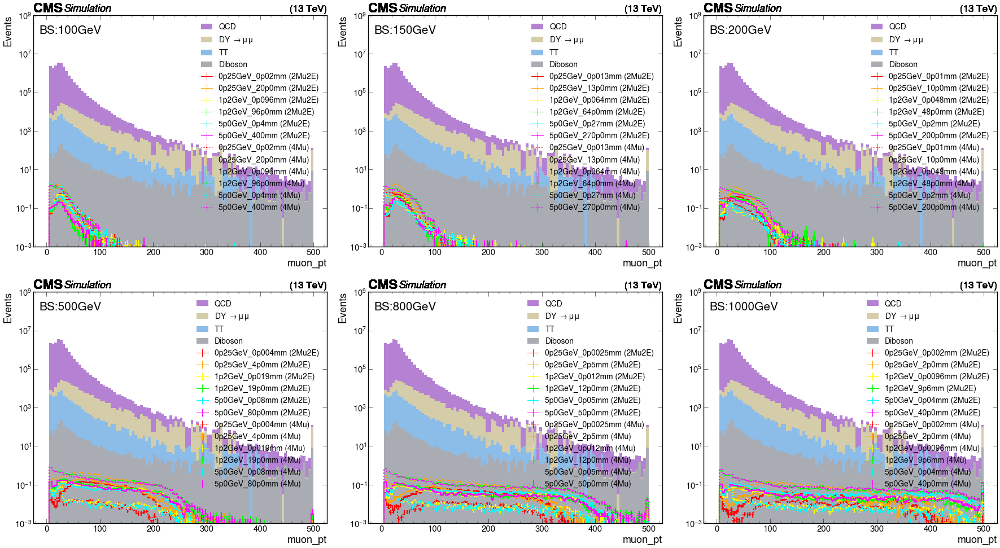

In [38]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

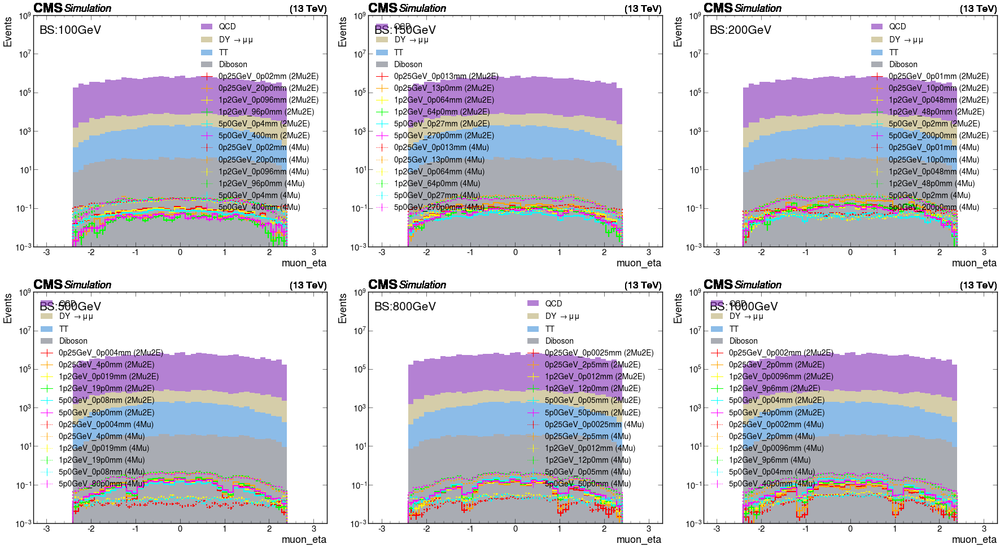

In [40]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_eta",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="muon_eta"
)

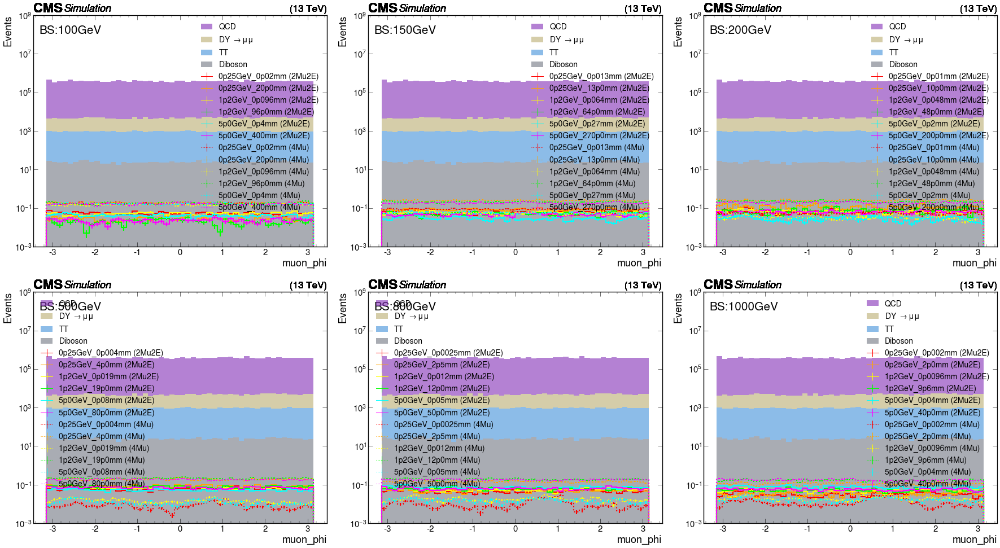

In [41]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_phi",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="muon_phi"
)

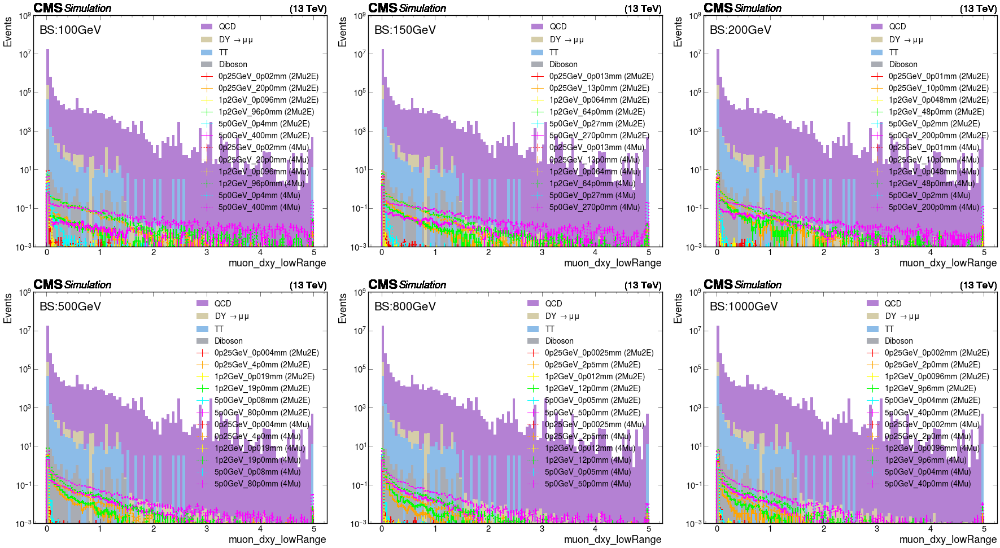

In [42]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="muon_dxy_lowRange",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

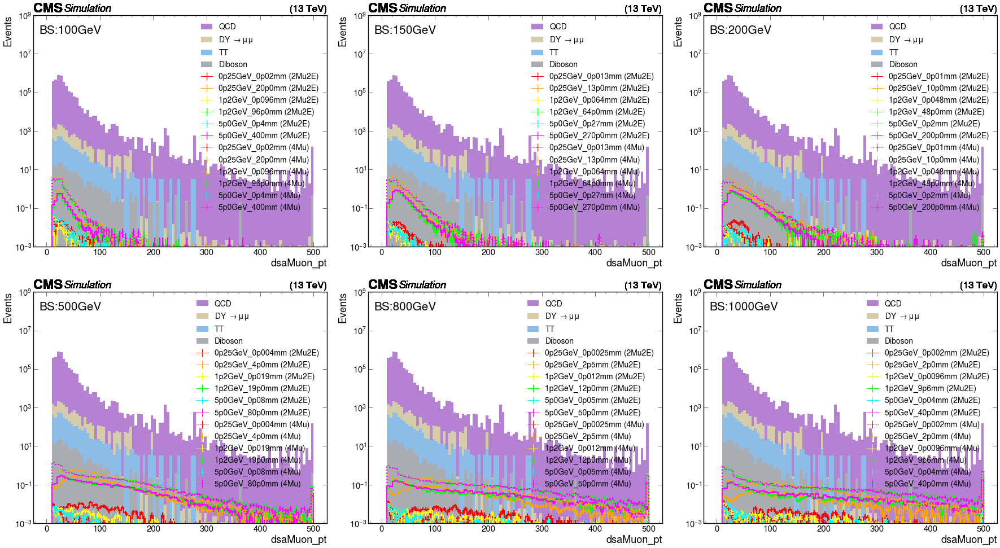

In [43]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

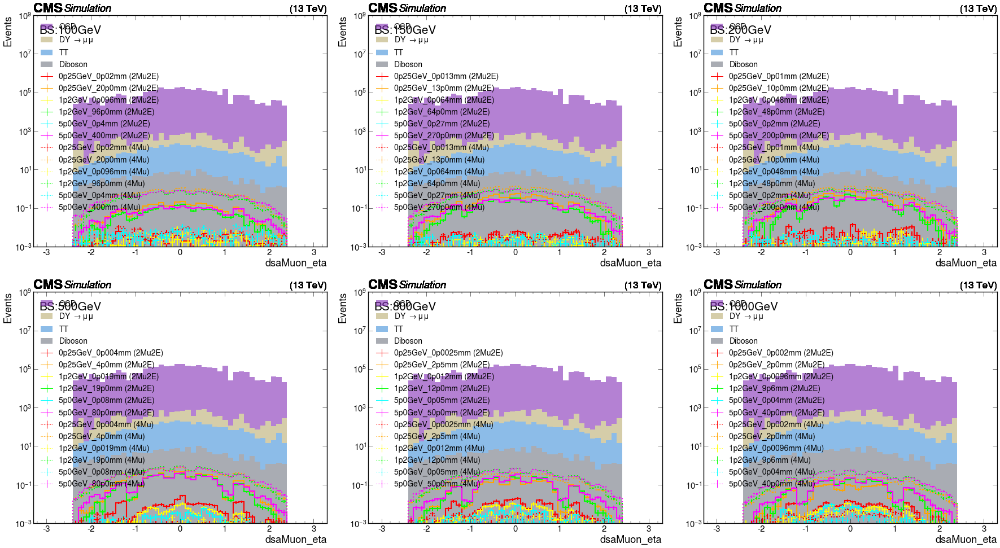

In [44]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_eta",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="dsaMuon_eta"
)

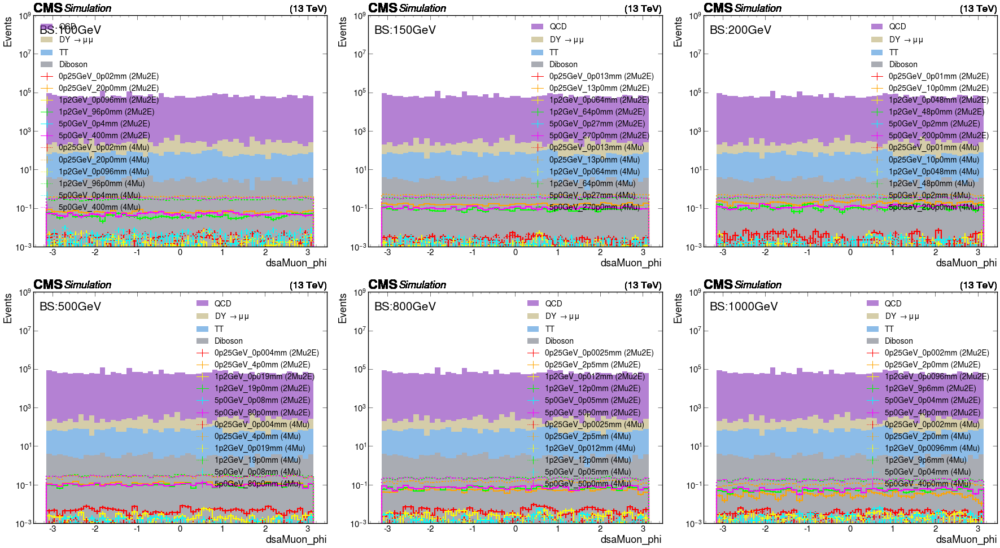

In [45]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_phi",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
    xlabel="dsaMuon_phi"
)

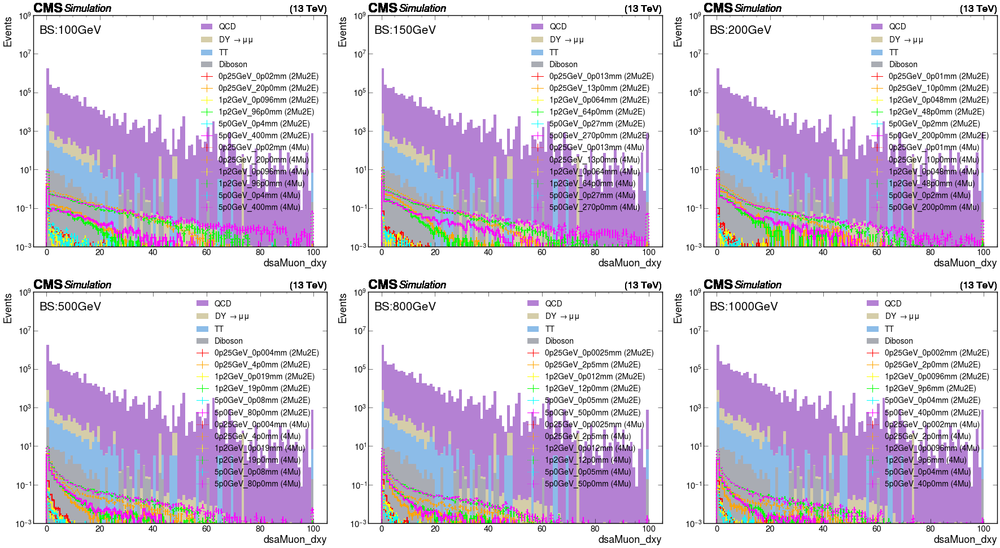

In [46]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

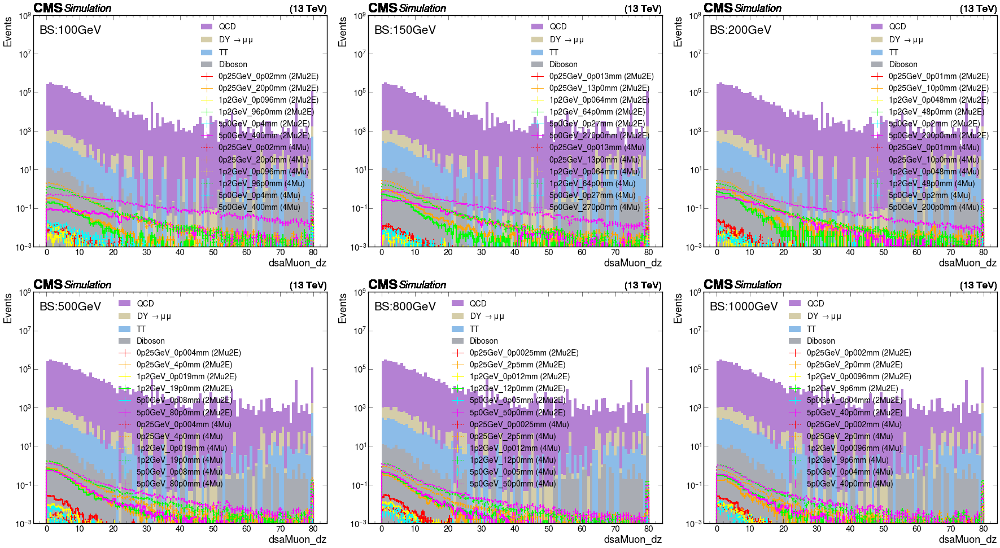

In [47]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMuon_dz",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

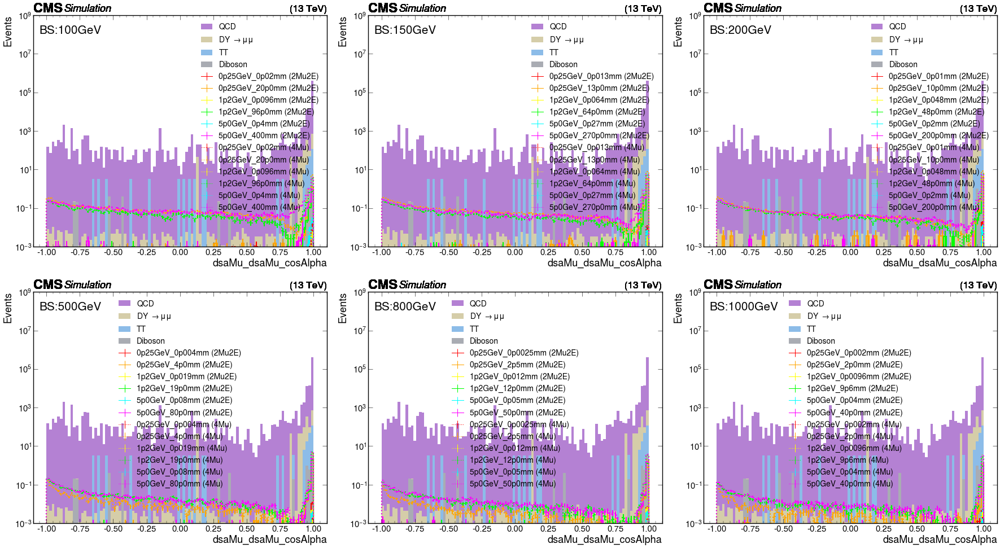

In [48]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsaMu_dsaMu_cosAlpha",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

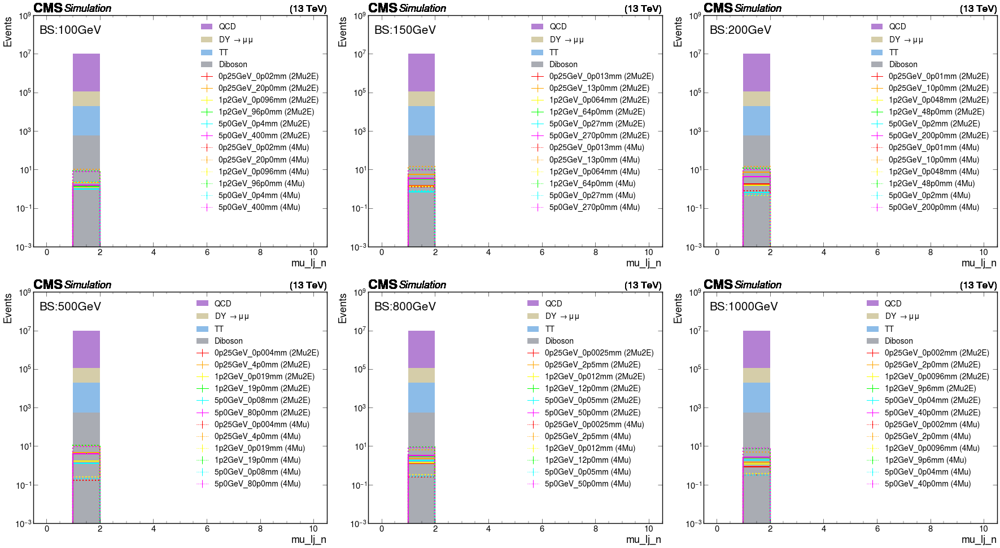

In [49]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

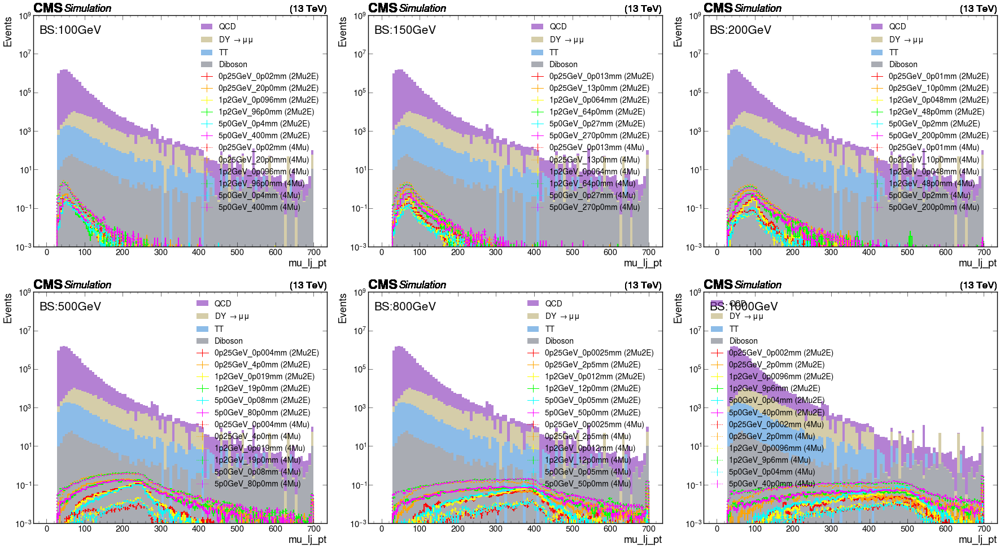

In [50]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

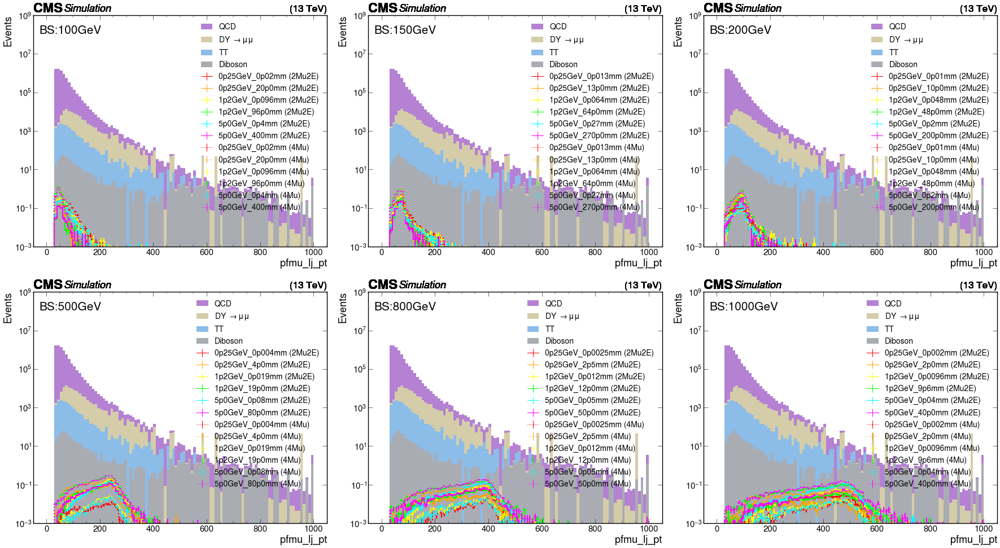

In [51]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_lj_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


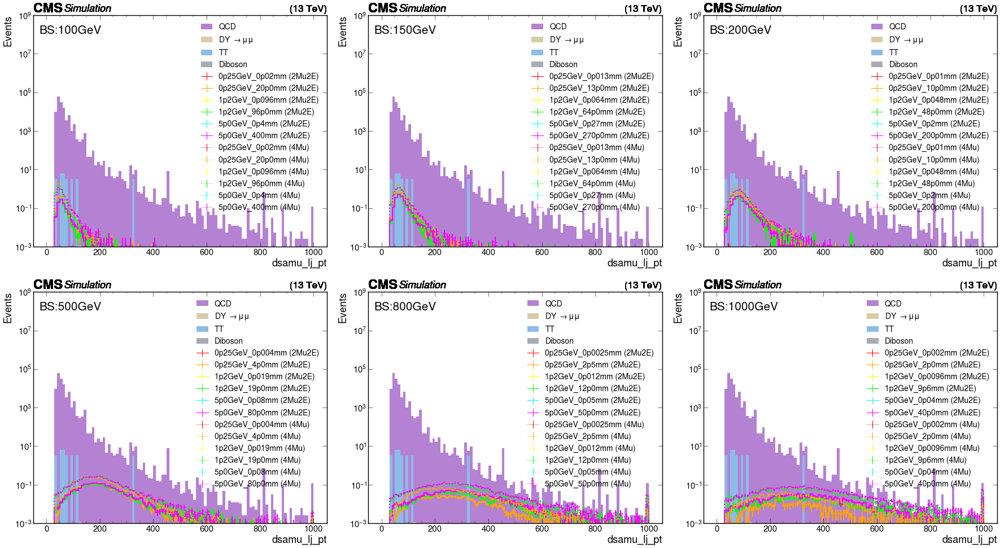

In [52]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_lj_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

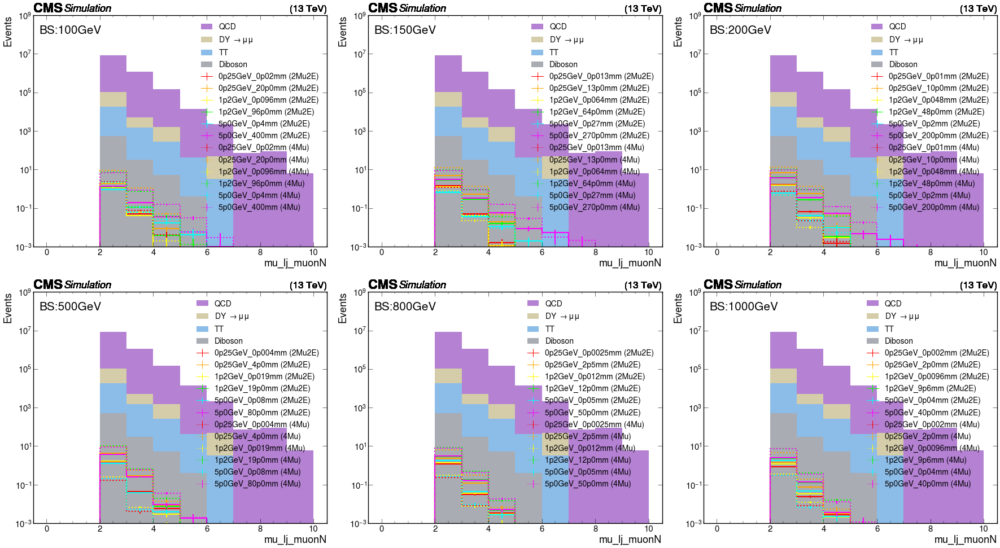

In [53]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_muonN",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

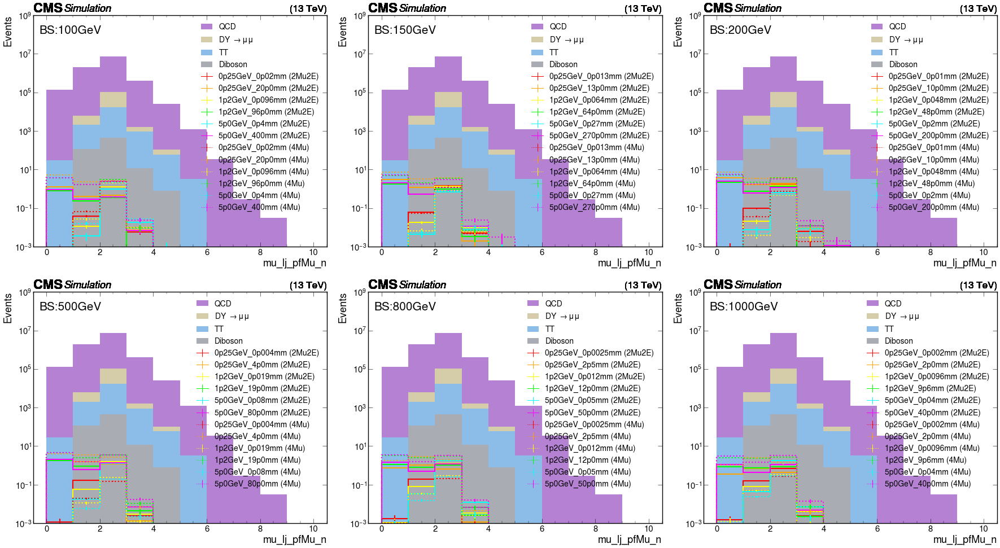

In [54]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pfMu_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

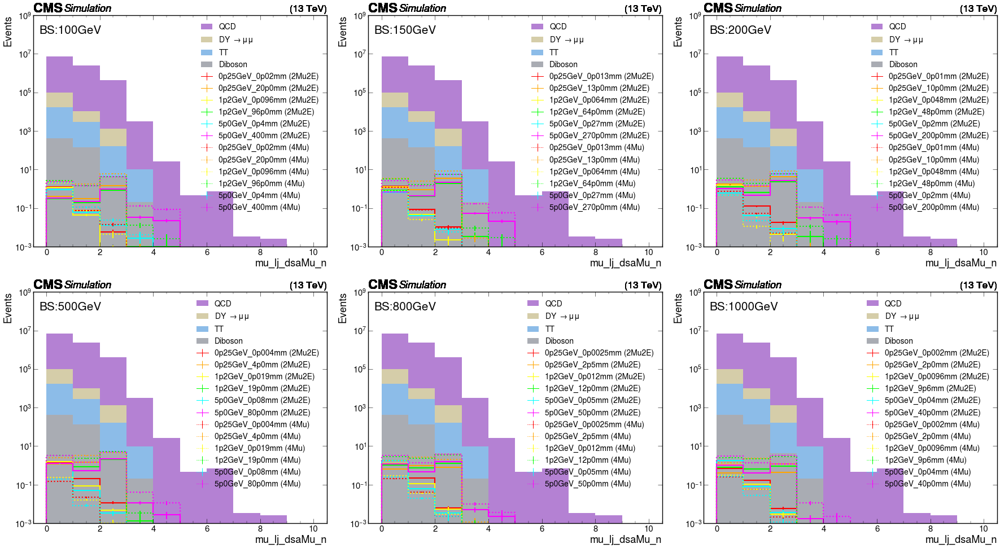

In [55]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMu_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

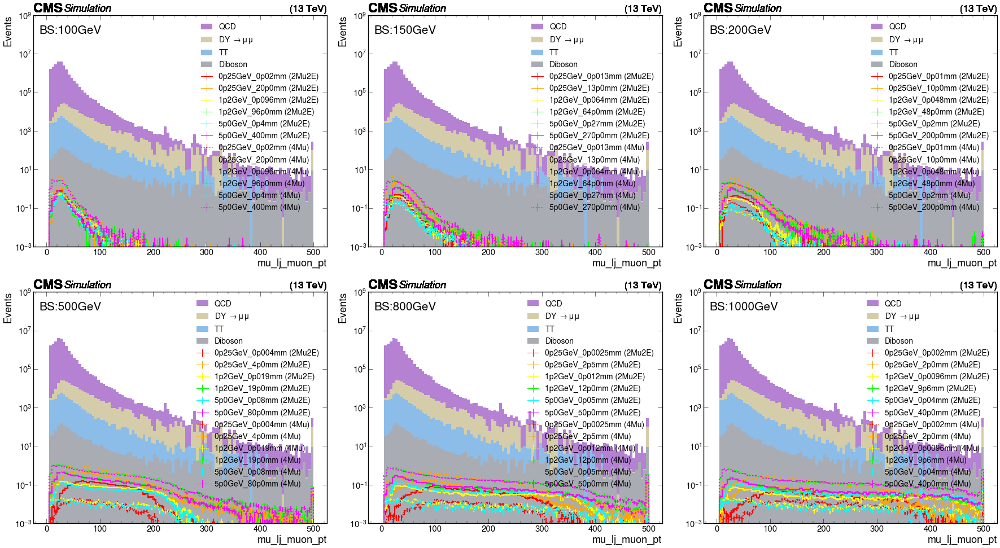

In [56]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_muon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

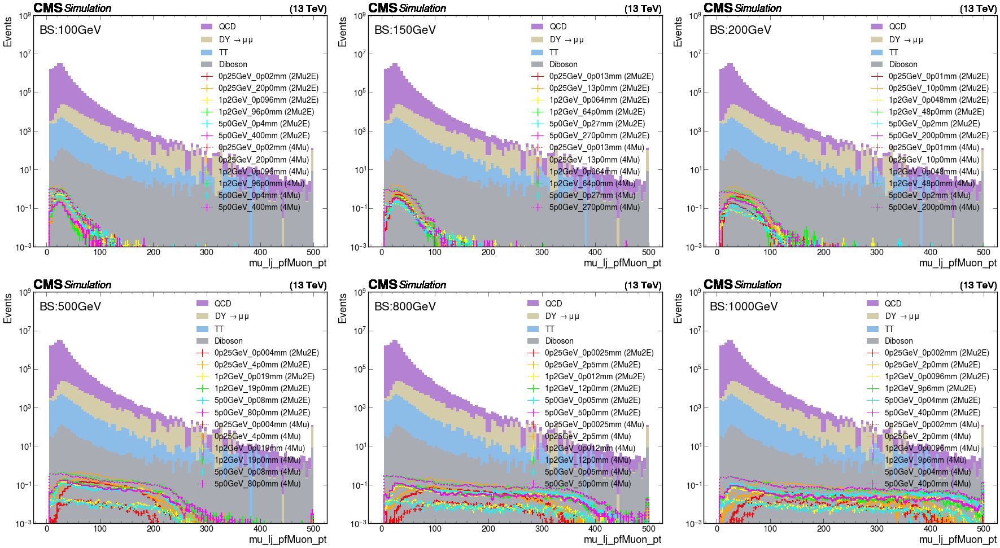

In [57]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pfMuon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

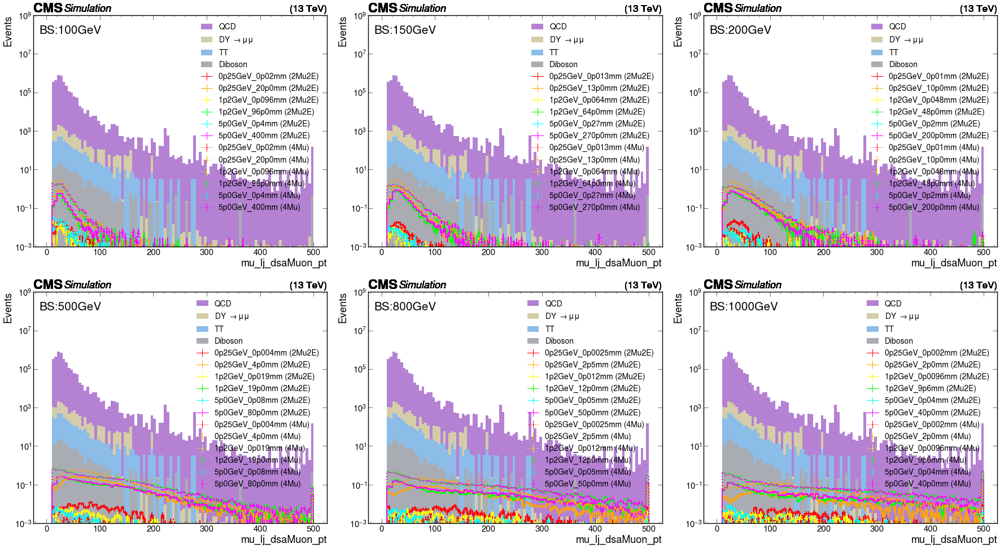

In [58]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMuon_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

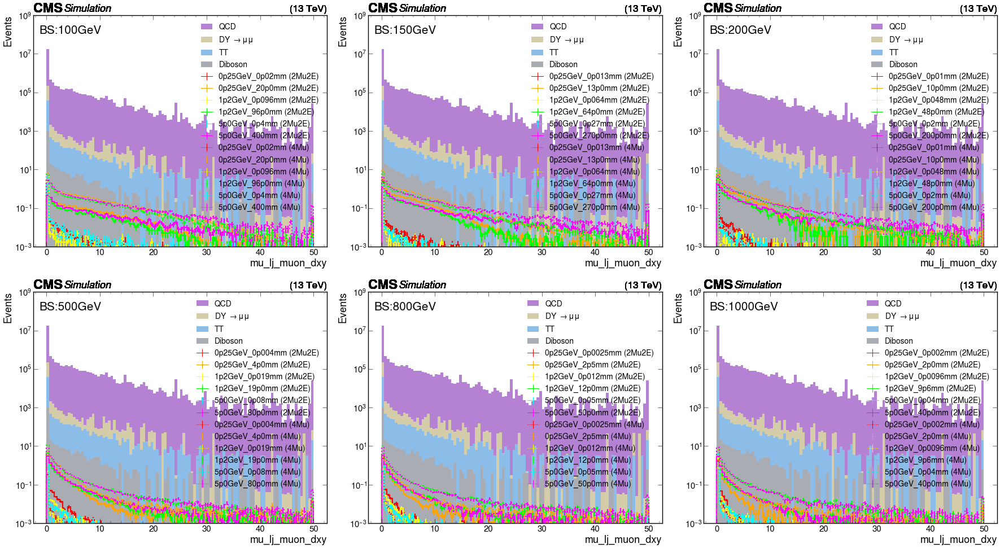

In [59]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_muon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

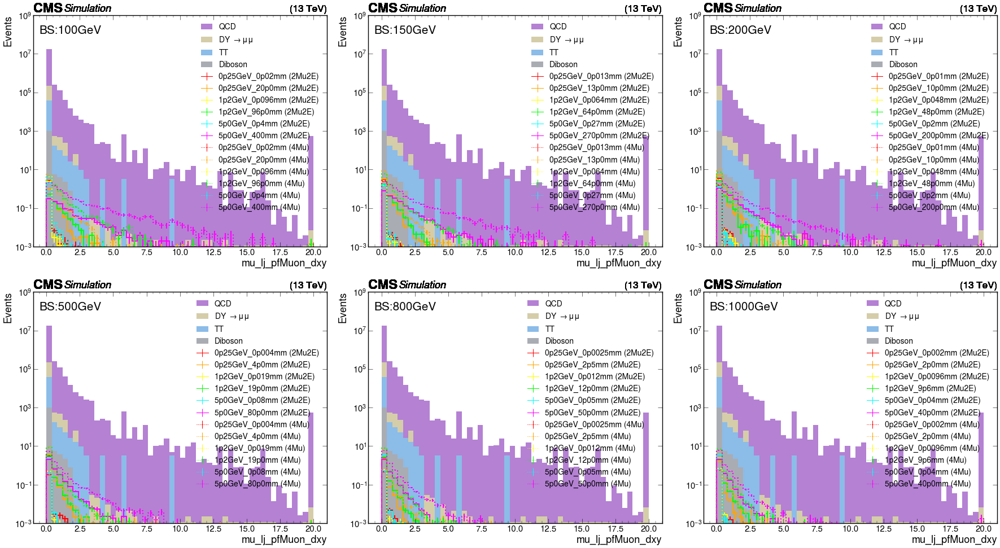

In [60]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_pfMuon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

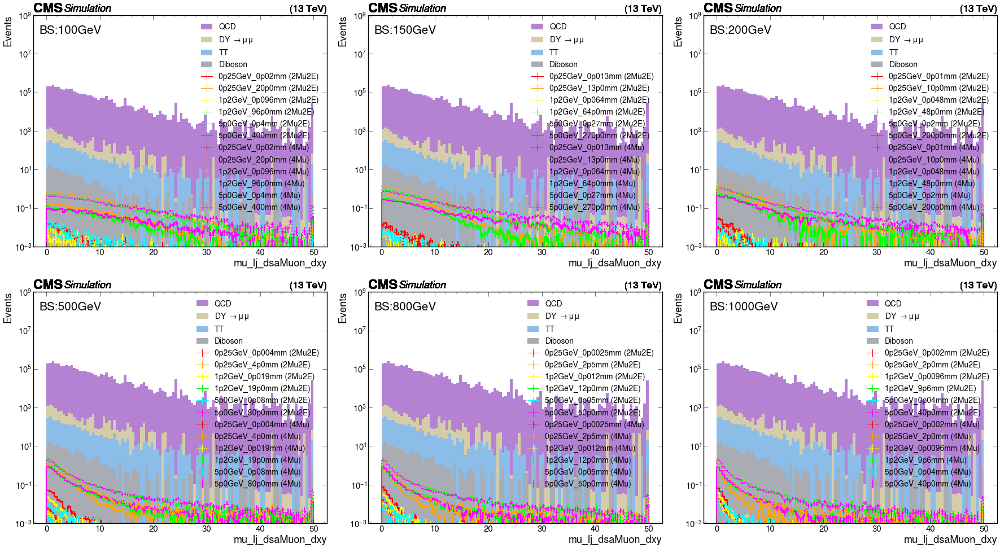

In [61]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMuon_dxy",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

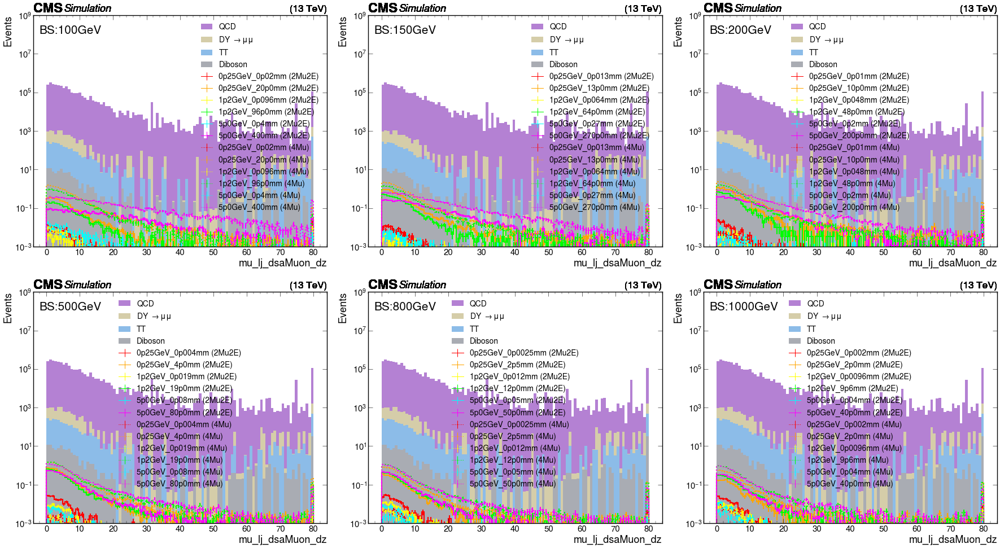

In [62]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_dsaMuon_dz",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

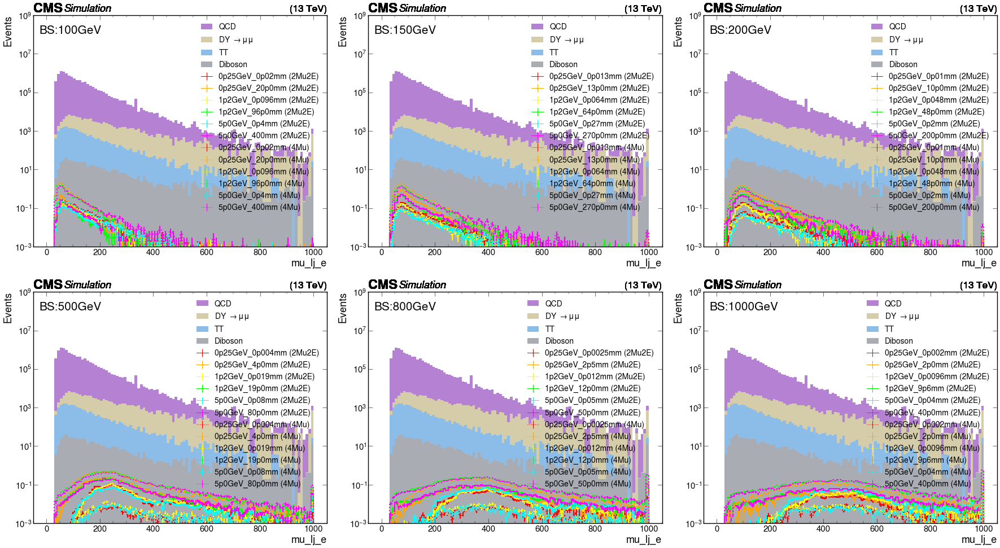

In [63]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

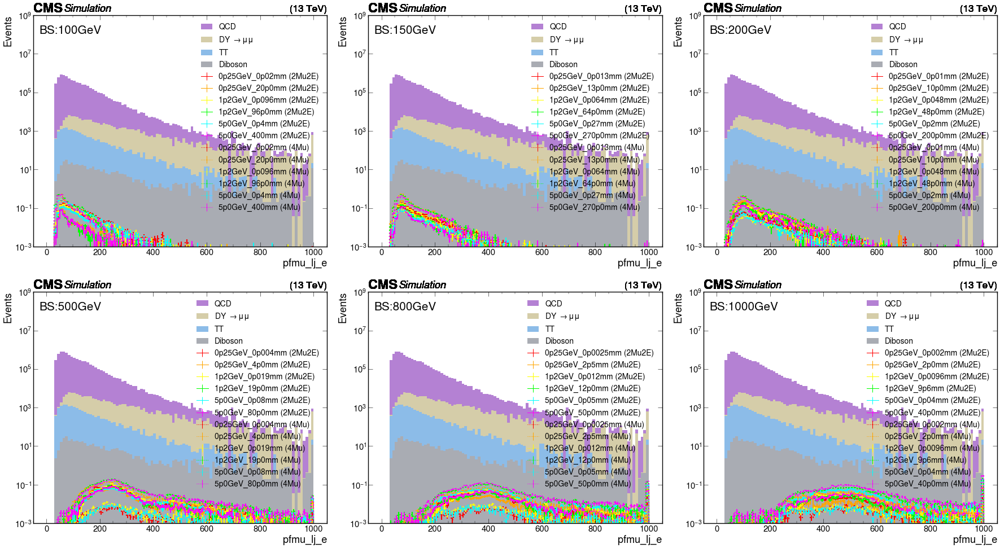

In [64]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_lj_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


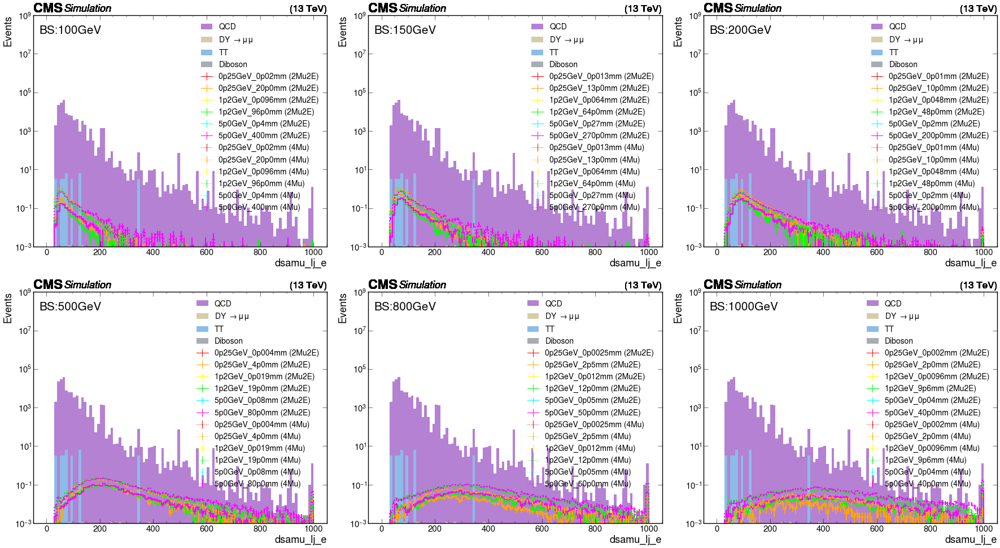

In [65]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_lj_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

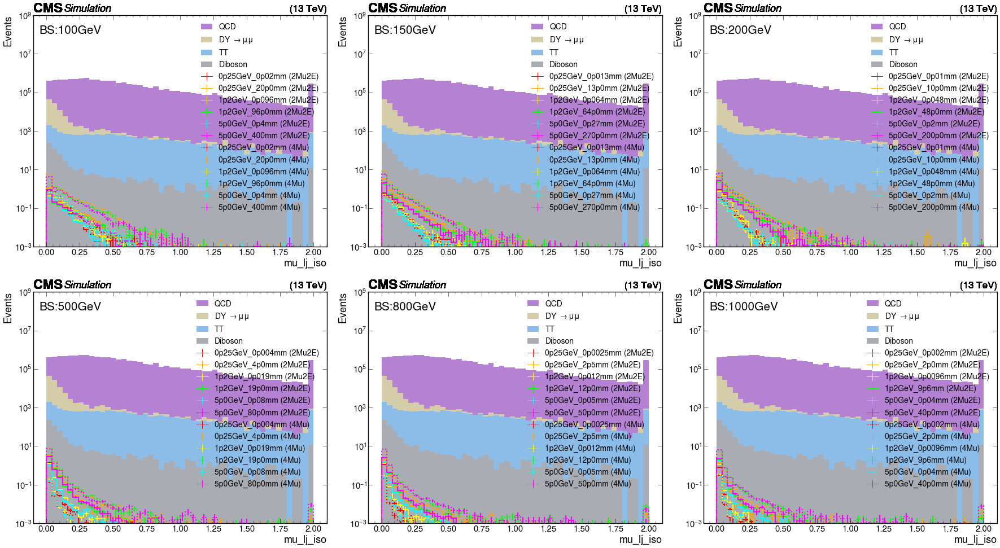

In [66]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_lj_iso",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

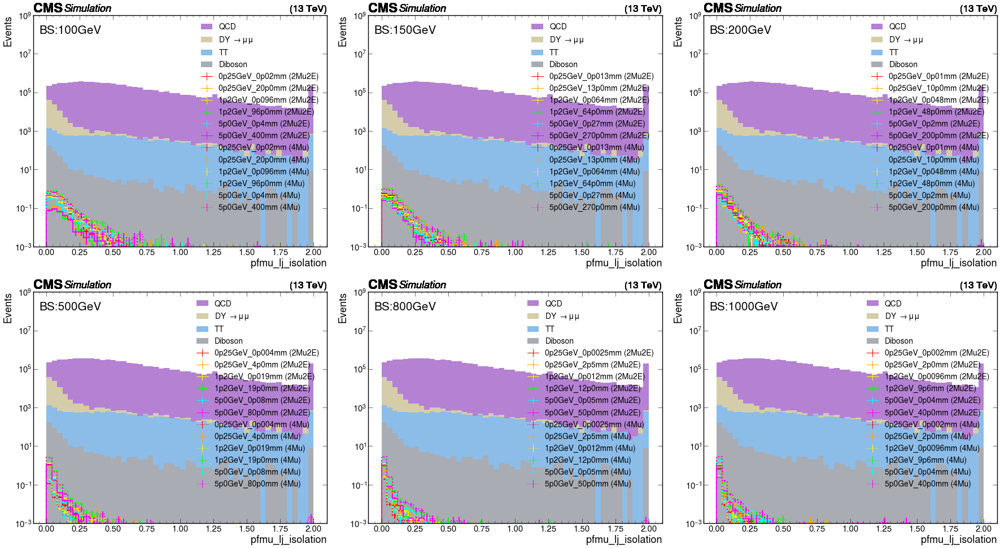

In [72]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_lj_isolation",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


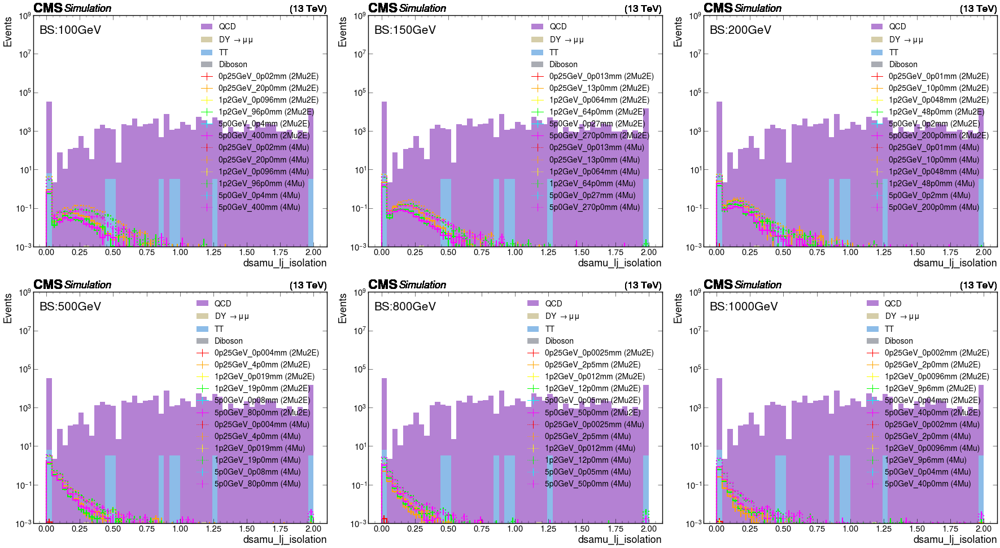

In [77]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_lj_isolation",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

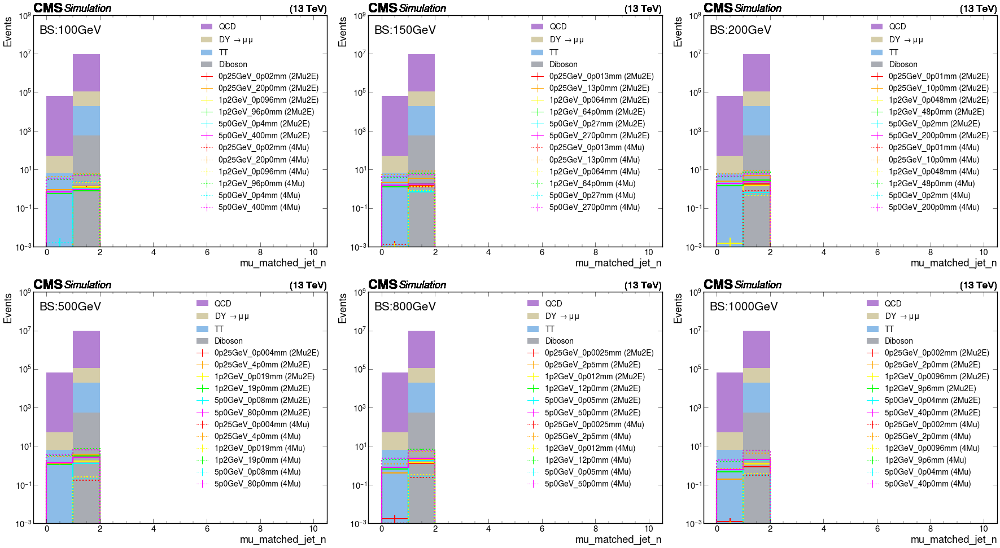

In [78]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_n",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

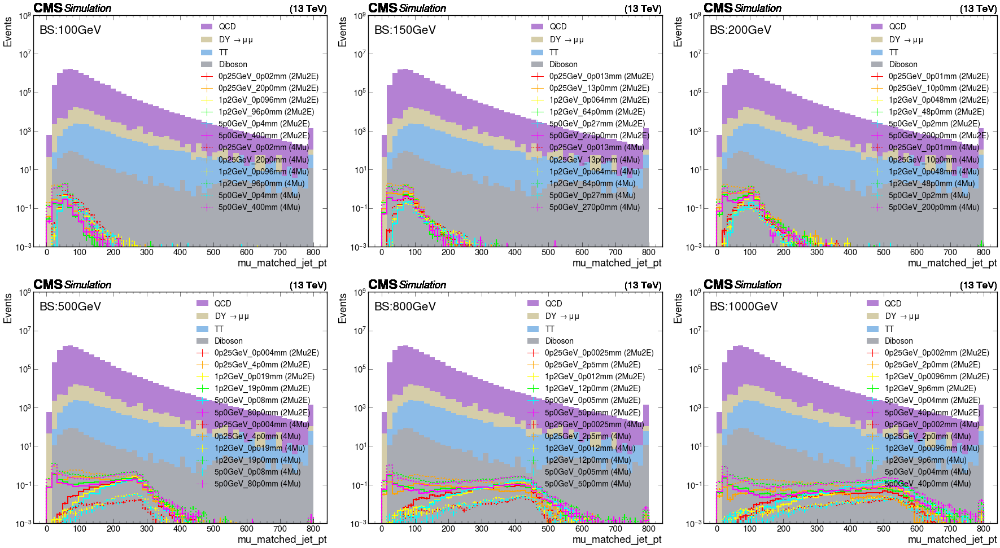

In [79]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

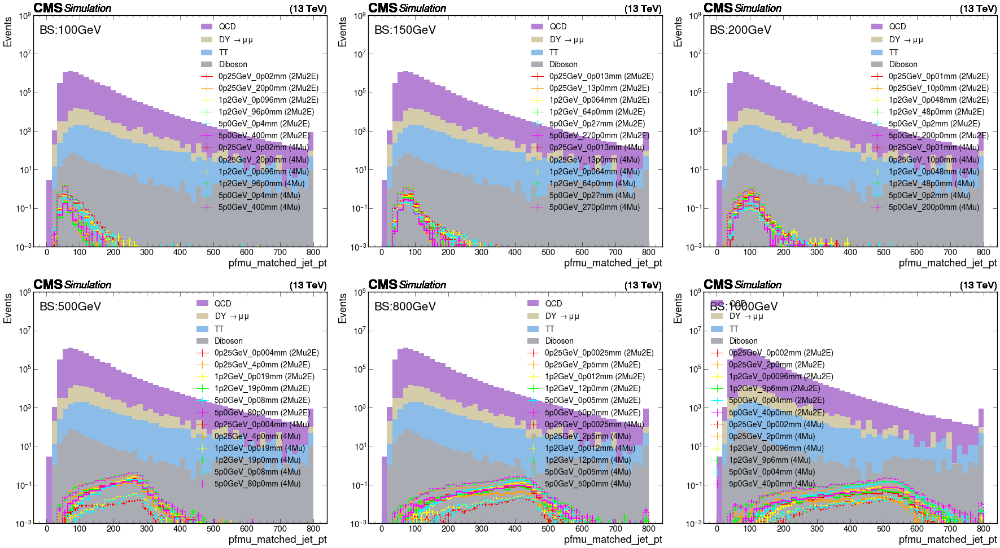

In [80]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


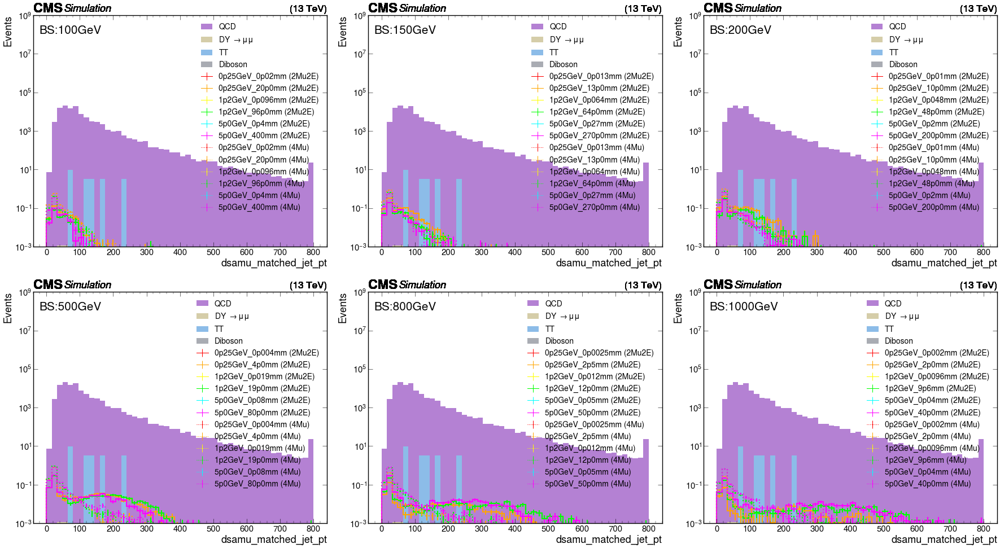

In [81]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_pt",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

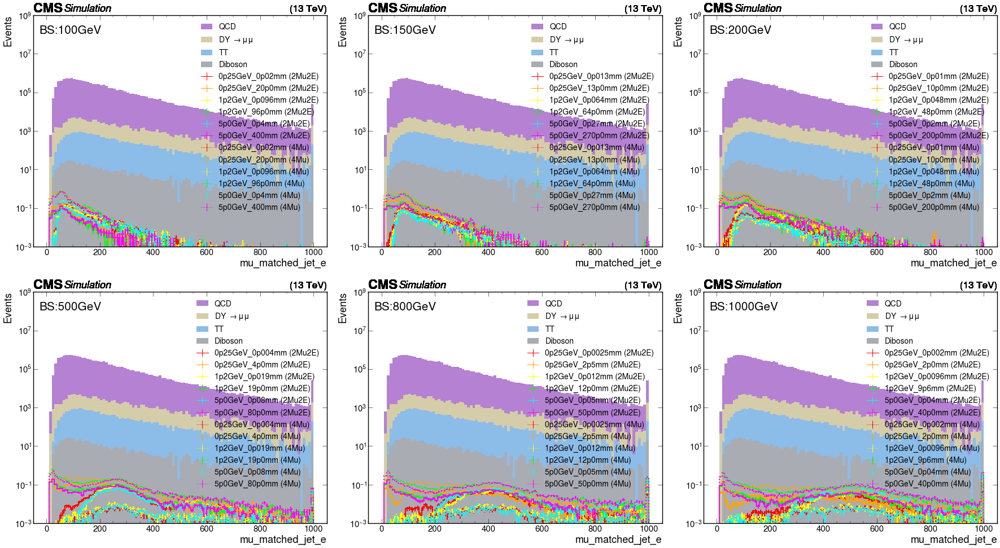

In [82]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

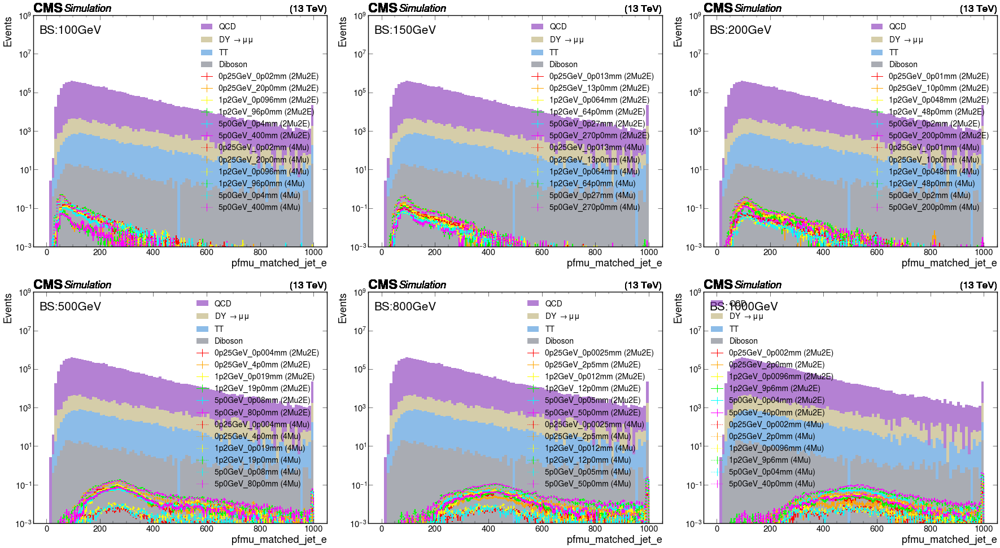

In [83]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


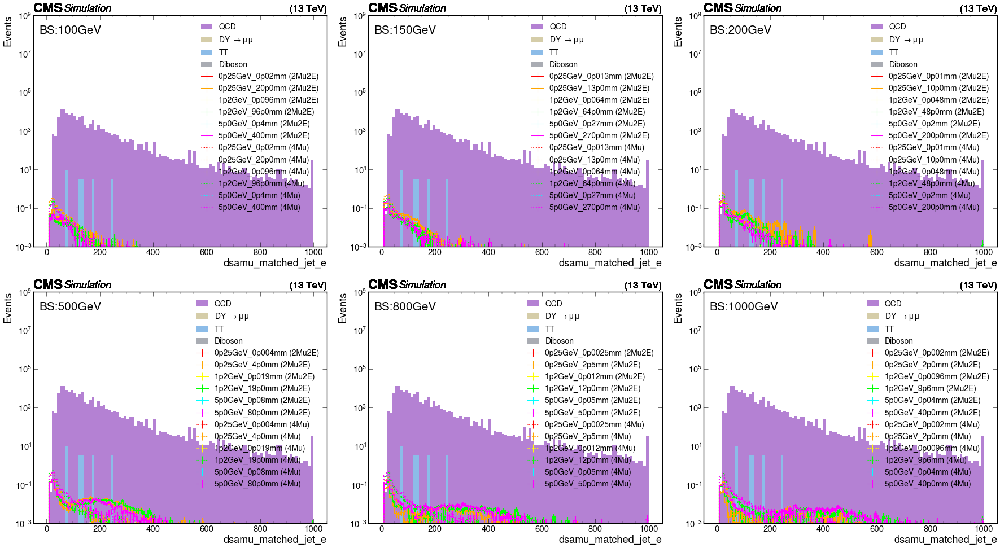

In [84]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_e",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

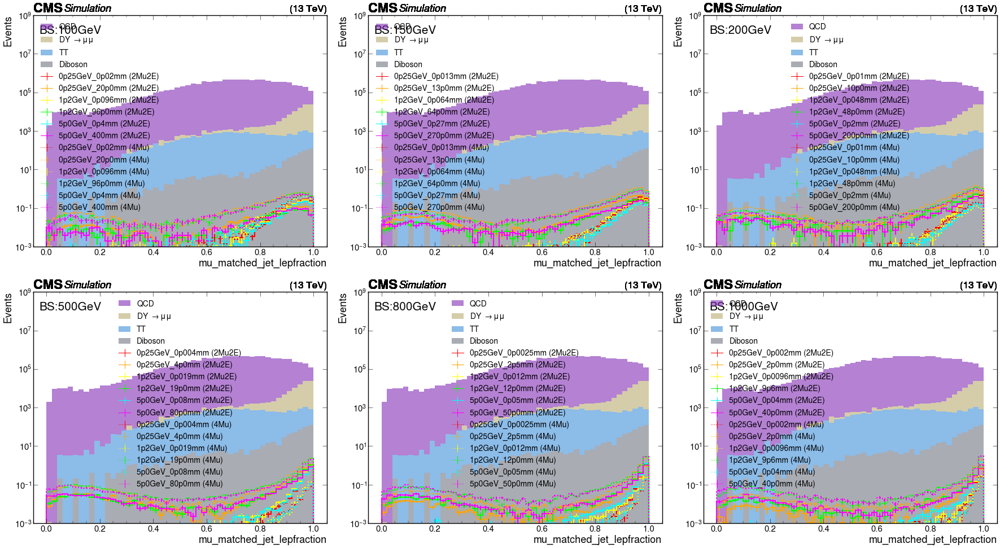

In [85]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_lepfraction",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

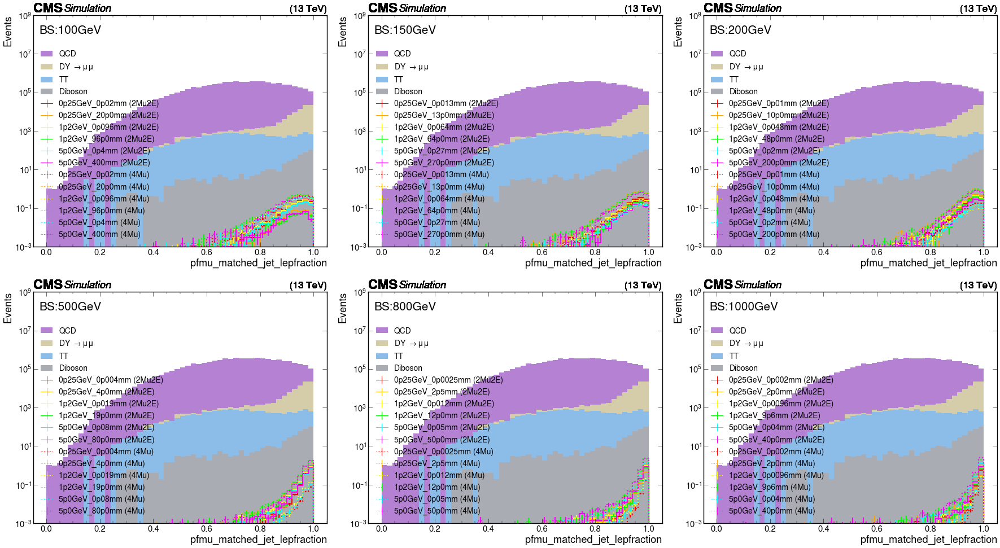

In [86]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_lepfraction",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


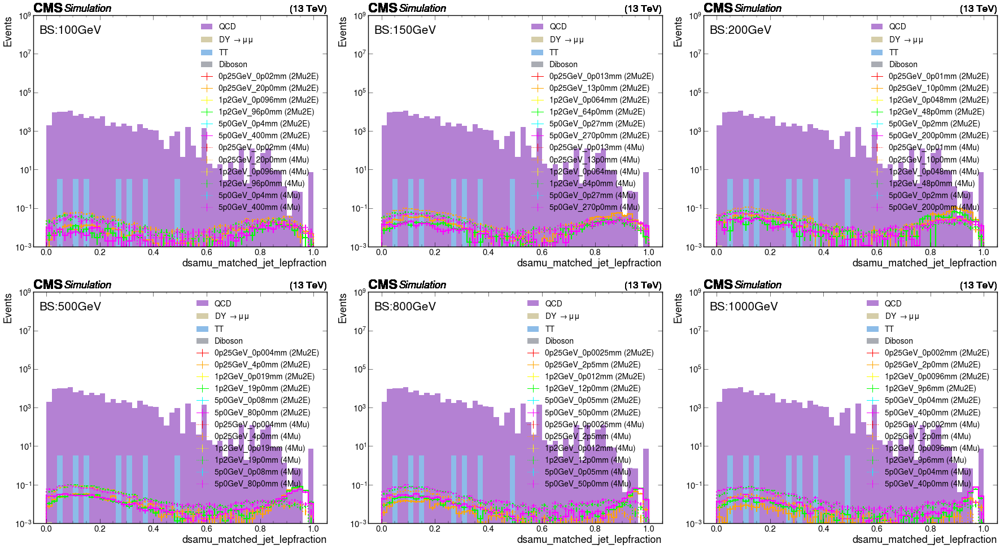

In [87]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_lepfraction",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

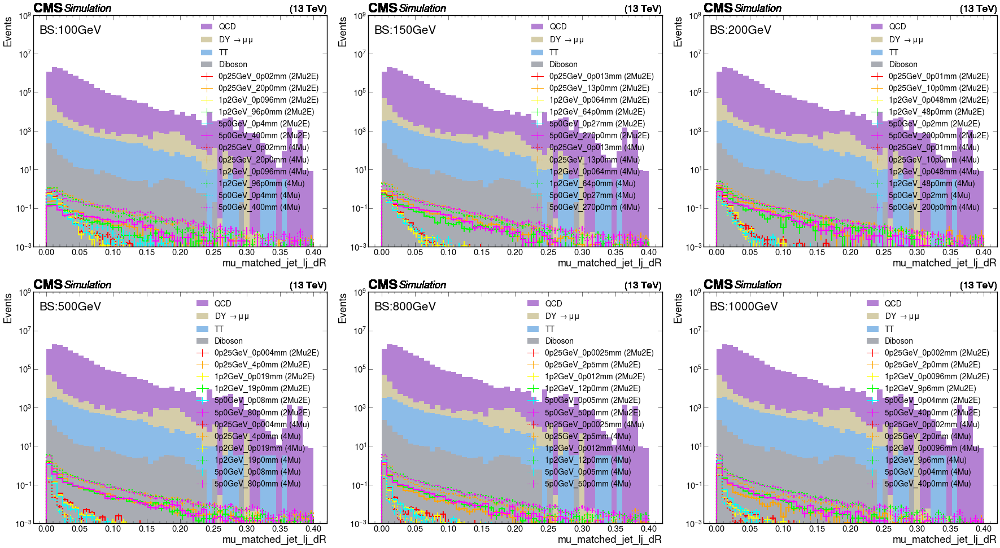

In [88]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_matched_jet_lj_dR",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

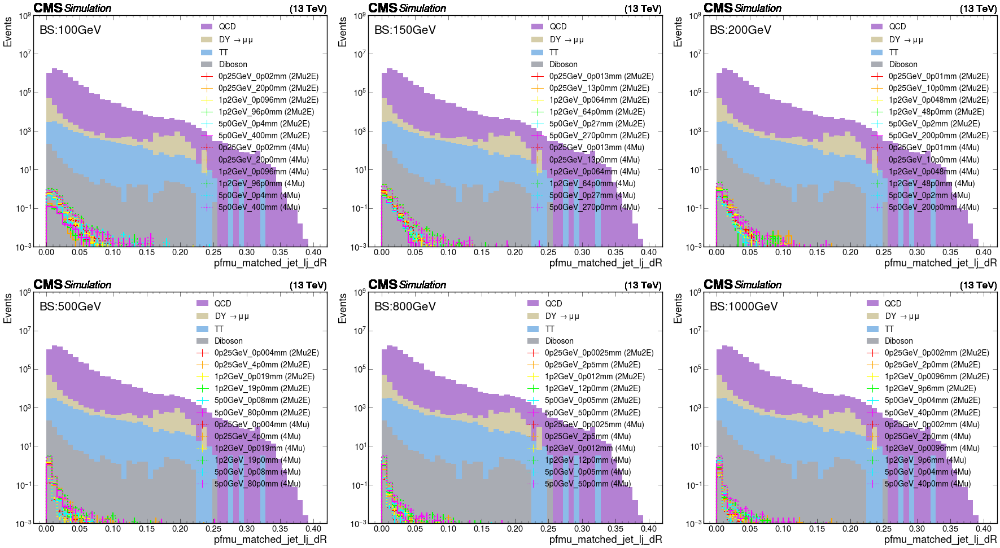

In [89]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_matched_jet_lj_dR",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


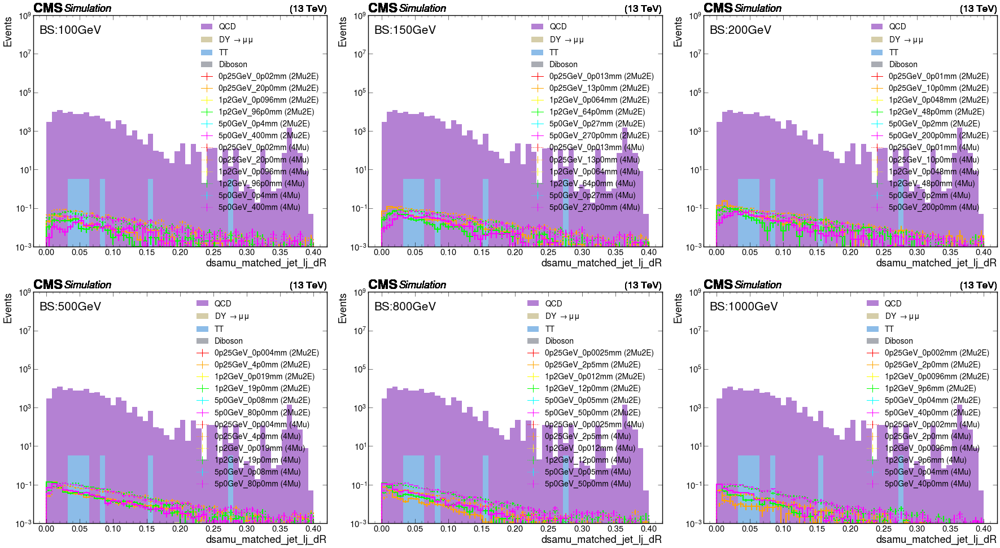

In [90]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_matched_jet_lj_dR",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

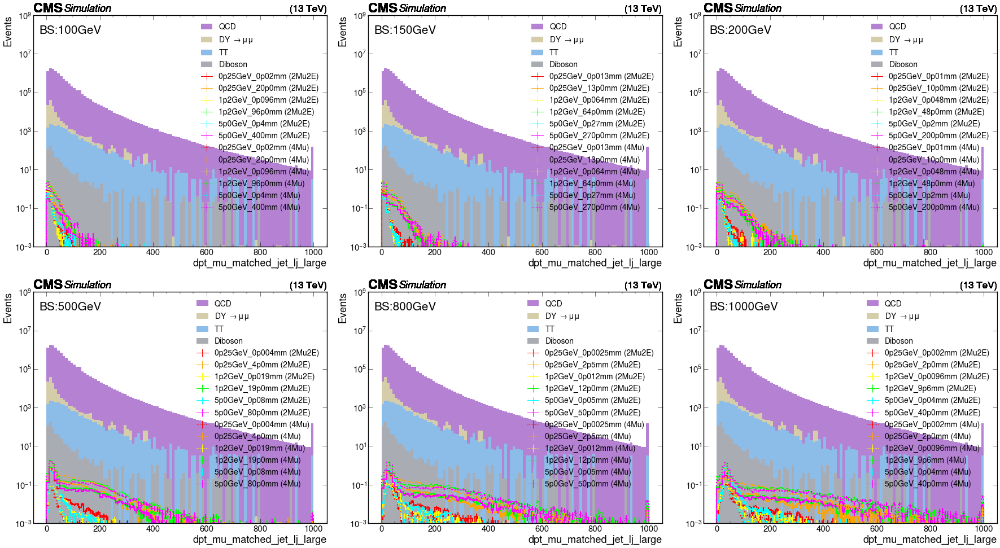

In [91]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dpt_mu_matched_jet_lj_large",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

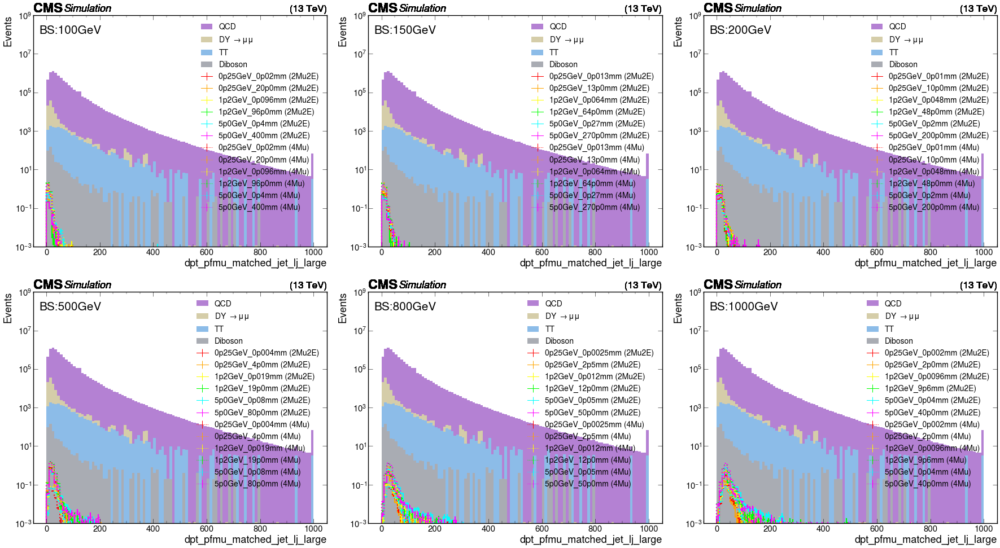

In [92]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dpt_pfmu_matched_jet_lj_large",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


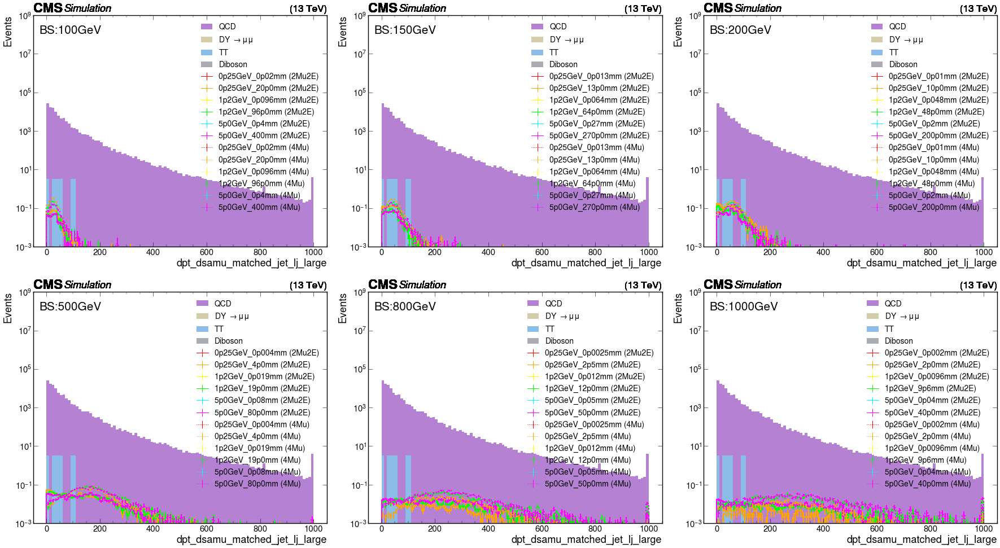

In [93]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dpt_dsamu_matched_jet_lj_large",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

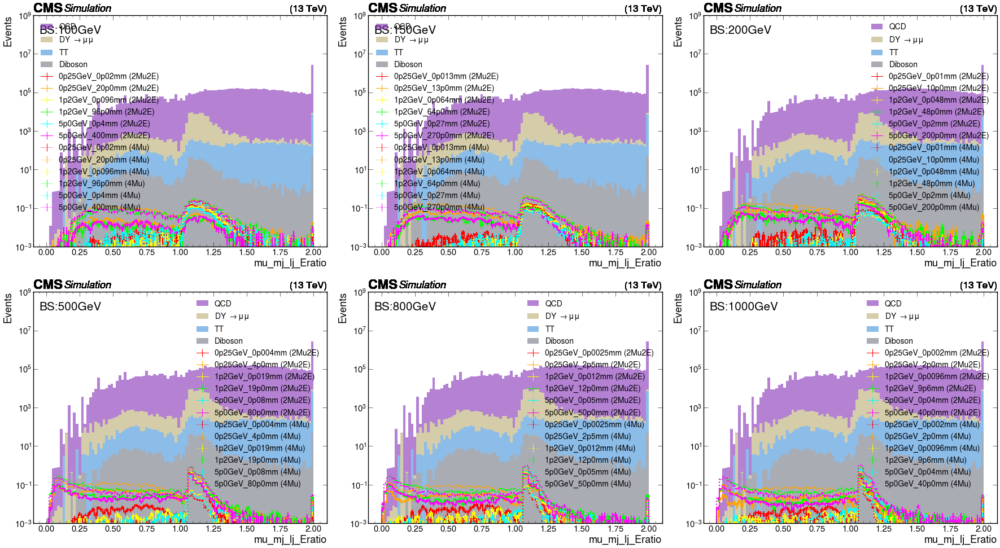

In [94]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="mu_mj_lj_Eratio",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

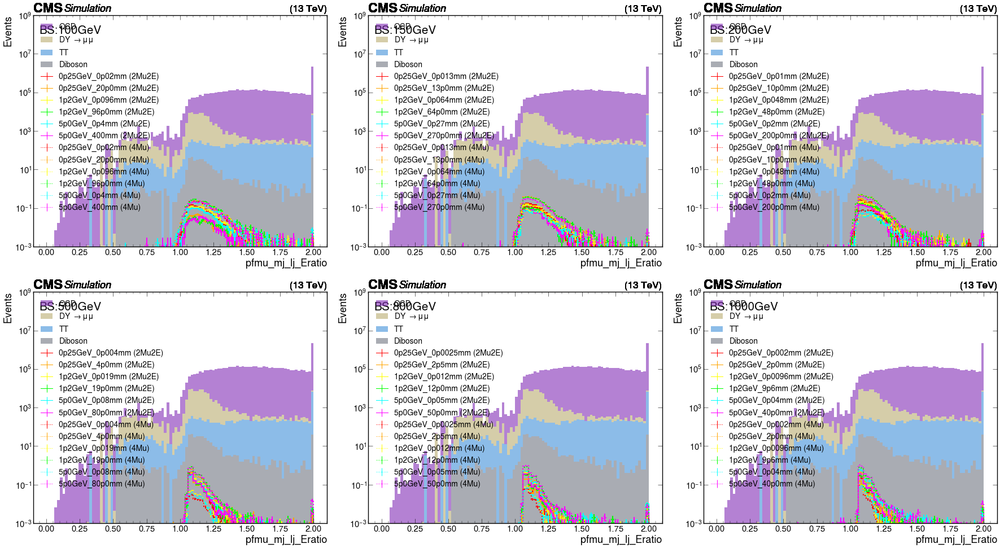

In [95]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="pfmu_mj_lj_Eratio",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)

/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)
/usr/local/lib/python3.12/site-packages/mplhep/utils.py:486: RuntimeWarning: All sumw are zero!  Cannot compute meaningful error bars
  return np.abs(method_fcn(self.values, variances) - self.values)


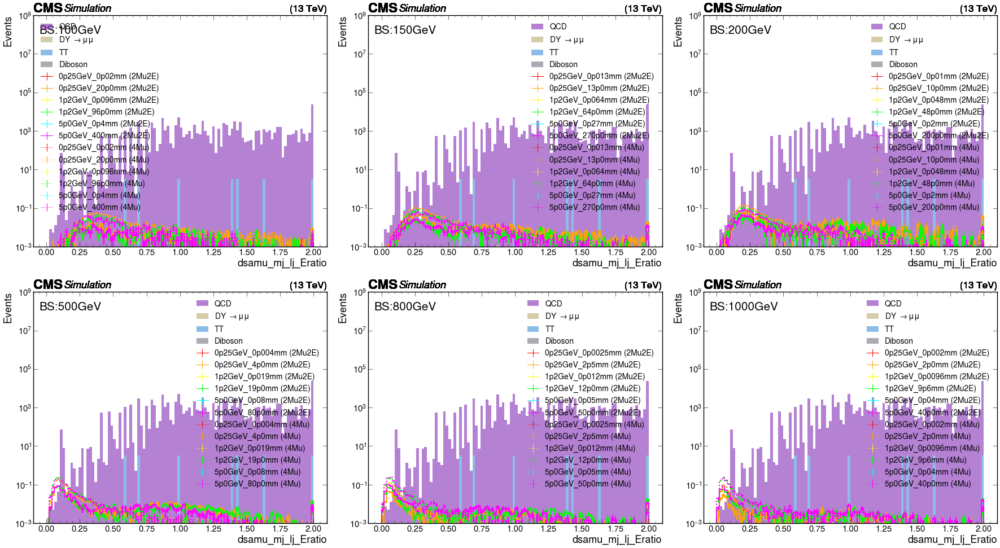

In [96]:
fig, axes = utilities.plot_MC_sig_vs_bkg_panels(
    out=out,
    channels=channels,
    backgrounds=backgrounds,
    signal_maps=signal_maps,
    variable="dsamu_mj_lj_Eratio",
    background_colors=background_colors,
    signal_colors=signal_colors,
    signal_linestyles=signal_linestyles,
)